# PyMEOS Demo for ACM Demo

In [31]:
from functools import partial

import contextily as cx
import pandas as pd
import pyproj
import shapely as shp
from matplotlib import pyplot as plt
from pymeos import *
from pymeos.plotters import TemporalPointSequencePlotter, TemporalSequencePlotter
from shapely.ops import transform
from tqdm.auto import tqdm
import plotly.express as px

tqdm.pandas()
pymeos_initialize()

# Import specific classes that might not be included in *
from pymeos import TsTzSpan, STBox

In [10]:
data = 'selection'
# data = 'full'

## Preprocessing

In [11]:
raw = pd.read_csv('Singaporepart0000.csv', header=0,
                  names=['ID', 'Trajectory ID', 'Driving Mode', 'OS Name', 'Timestamp', 'Latitude', 'Longitude',
                         'Speed', 'Bearing', 'Accuracy'],
                  usecols=['Trajectory ID', 'Timestamp', 'Latitude', 'Longitude', 'Speed', 'Bearing', 'Accuracy'])
raw.head()

,Trajectory ID,Timestamp,Latitude,Longitude,Speed,Bearing,Accuracy
0,70014,1554943236,1.342326,103.888969,18.910000,248,3.9
1,73573,1555582623,1.321781,103.856366,17.719076,44,4.0
2,75567,1555141026,1.327088,103.861273,14.021548,34,3.9
3,1410,1555731693,1.262482,103.823794,13.026521,181,4.0
4,4354,1555584497,1.283799,103.807210,14.812943,93,3.9


We preprocess the row data so that:
- Rows that have null values are deleted.
- Timestamps are converted from millis since epoch to `datetime` objects.
- A new column with Shapely Points is generated.
- Points are transformed from EPSG:4326 to EPSG:3414

In [12]:
raw = raw.dropna()
raw['Timestamp'] = pd.to_datetime(raw['Timestamp'], origin='unix', unit='s')
raw['Location'] = shp.points(raw['Longitude'], raw['Latitude'])
raw.head()

,Trajectory ID,Timestamp,Latitude,Longitude,Speed,Bearing,Accuracy,Location
0,70014,2019-04-11 00:40:36,1.342326,103.888969,18.910000,248,3.9,POINT (103.888969 1.3423256)
1,73573,2019-04-18 10:17:03,1.321781,103.856366,17.719076,44,4.0,POINT (103.8563664 1.3217811)
2,75567,2019-04-13 07:37:06,1.327088,103.861273,14.021548,34,3.9,POINT (103.8612733 1.3270883)
3,1410,2019-04-20 03:41:33,1.262482,103.823794,13.026521,181,4.0,POINT (103.8237941 1.2624821)
4,4354,2019-04-18 10:48:17,1.283799,103.807210,14.812943,93,3.9,POINT (103.8072101 1.283799)


In [13]:
wgs84 = pyproj.CRS('EPSG:4326')
svy21 = pyproj.CRS('EPSG:3414')

project = partial(transform, pyproj.Transformer.from_crs(wgs84, svy21, always_xy=True).transform)

raw['Location'] = raw['Location'].progress_map(project)
raw.head()

  0%|          | 0/3034553 [00:00<?, ?it/s]

,Trajectory ID,Timestamp,Latitude,Longitude,Speed,Bearing,Accuracy,Location
0,70014,2019-04-11 00:40:36,1.342326,103.888969,18.910000,248,3.9,POINT (34193.28884111905 36053.13149951502)
1,73573,2019-04-18 10:17:03,1.321781,103.856366,17.719076,44,4.0,POINT (30564.99363142349 33781.36742634621)
2,75567,2019-04-13 07:37:06,1.327088,103.861273,14.021548,34,3.9,POINT (31111.07630748856 34368.21604473357)
3,1410,2019-04-20 03:41:33,1.262482,103.823794,13.026521,181,4.0,POINT (26939.99544875286 27224.3800194543)
4,4354,2019-04-18 10:48:17,1.283799,103.807210,14.812943,93,3.9,POINT (25094.34194091269 29581.5053866697)


## PyMEOS objects generation
Now, we use the original dataset to build the PyMEOS temporal objects.

In [14]:
trajectories = raw[['Trajectory ID', 'Timestamp']].copy()

We start by generating an instant object (`TFloatInst` and `TGeomPointInst`) from the original data

In [15]:
trajectories['Speed'] = raw.progress_apply(lambda row: TFloatInst(value=row['Speed'], timestamp=row['Timestamp']),
                                           axis=1)
trajectories['Bearing'] = raw.progress_apply(lambda row: TFloatInst(value=row['Bearing'], timestamp=row['Timestamp']),
                                             axis=1)
trajectories['Location'] = raw.progress_apply(
    lambda row: TGeomPointInst(point=row['Location'], timestamp=row['Timestamp']), axis=1)
trajectories.head()

  0%|          | 0/3034553 [00:00<?, ?it/s]

  0%|          | 0/3034553 [00:00<?, ?it/s]

  0%|          | 0/3034553 [00:00<?, ?it/s]

,Trajectory ID,Timestamp,Speed,Bearing,Location
0,70014,2019-04-11 00:40:36,18.91@2019-04-11 00:40:36+02,248@2019-04-11 00:40:36+02,POINT(34193.28884111905 36053.13149951502)@201...
1,73573,2019-04-18 10:17:03,17.719076@2019-04-18 10:17:03+02,44@2019-04-18 10:17:03+02,POINT(30564.99363142349 33781.36742634621)@201...
2,75567,2019-04-13 07:37:06,14.021548@2019-04-13 07:37:06+02,34@2019-04-13 07:37:06+02,POINT(31111.07630748856 34368.21604473357)@201...
3,1410,2019-04-20 03:41:33,13.026521@2019-04-20 03:41:33+02,181@2019-04-20 03:41:33+02,POINT(26939.99544875286 27224.3800194543)@2019...
4,4354,2019-04-18 10:48:17,14.812943@2019-04-18 10:48:17+02,93@2019-04-18 10:48:17+02,POINT(25094.34194091269 29581.5053866697)@2019...


In [16]:
t = trajectories[['Trajectory ID', 'Timestamp']].copy()
t['Speed'] = trajectories['Speed'].progress_map(lambda x: x.as_hexwkb())
t['Bearing'] = trajectories['Bearing'].progress_map(lambda x: x.as_hexwkb())
t['Location'] = trajectories['Location'].progress_map(lambda x: x.as_hexwkb())
t.to_csv('singapore_instants.csv', index=False)

  0%|          | 0/3034553 [00:00<?, ?it/s]

  0%|          | 0/3034553 [00:00<?, ?it/s]

  0%|          | 0/3034553 [00:00<?, ?it/s]

In [17]:
trajectories = pd.read_csv('singapore_instants.csv', parse_dates=['Timestamp'], converters={
    'Speed': TFloatInst.from_hexwkb,
    'Bearing': TFloatInst.from_hexwkb,
    'Location': partial(TGeomPointInst.from_hexwkb, srid=3414)
})
trajectories.head()

,Trajectory ID,Timestamp,Speed,Bearing,Location
0,70014,2019-04-11 00:40:36,18.91@2019-04-11 00:40:36+02,248@2019-04-11 00:40:36+02,POINT(34193.28884111905 36053.13149951502)@201...
1,73573,2019-04-18 10:17:03,17.719076@2019-04-18 10:17:03+02,44@2019-04-18 10:17:03+02,POINT(30564.99363142349 33781.36742634621)@201...
2,75567,2019-04-13 07:37:06,14.021548@2019-04-13 07:37:06+02,34@2019-04-13 07:37:06+02,POINT(31111.07630748856 34368.21604473357)@201...
3,1410,2019-04-20 03:41:33,13.026521@2019-04-20 03:41:33+02,181@2019-04-20 03:41:33+02,POINT(26939.99544875286 27224.3800194543)@2019...
4,4354,2019-04-18 10:48:17,14.812943@2019-04-18 10:48:17+02,93@2019-04-18 10:48:17+02,POINT(25094.34194091269 29581.5053866697)@2019...


Now, we sort the rows by time, and aggregate them by Trajectory ID, aggregating the columns in lists

In [18]:
trajectories = trajectories.sort_values(by='Timestamp').groupby('Trajectory ID').agg(list)
trajectories.head()

,Timestamp,Speed,Bearing,Location
Trajectory ID,,,,
2,"[2019-04-09 02:38:49, 2019-04-09 02:38:51, 201...","[25.457024@2019-04-09 02:38:49+02, 25.45879@20...","[97@2019-04-09 02:38:49+02, 93@2019-04-09 02:3...",[POINT(30758.23769803839 28093.07811101536)@20...
3,"[2019-04-12 08:32:42, 2019-04-12 08:32:45, 201...","[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08...",[POINT(29996.54969954285 29441.684052369)@2019...
4,"[2019-04-13 10:42:46, 2019-04-13 10:42:54, 201...","[7.6499996@2019-04-13 10:42:46+02, 7.04@2019-0...","[205@2019-04-13 10:42:46+02, 194@2019-04-13 10...",[POINT(31299.05194543063 37460.64431485069)@20...
5,"[2019-04-20 01:39:39, 2019-04-20 01:39:50, 201...","[2.309606552124023@2019-04-20 01:39:39+02, 10....","[28@2019-04-20 01:39:39+02, 38@2019-04-20 01:3...",[POINT(21727.50153948193 35893.66292291419)@20...
8,"[2019-04-11 07:24:36, 2019-04-11 07:25:07, 201...","[13.21@2019-04-11 07:24:36+02, 0@2019-04-11 07...","[319@2019-04-11 07:24:36+02, 0@2019-04-11 07:2...",[POINT(41327.00952410777 35147.23516406312)@20...


Finally, instants are merged into PyMEOS Sequences

In [19]:
trajectories['Speed'] = trajectories['Speed'].progress_apply(lambda x: TFloatSeq(instant_list=x, upper_inc=True))
trajectories['Bearing'] = trajectories['Bearing'].progress_apply(lambda x: TFloatSeq(instant_list=x, upper_inc=True))
trajectories['Trajectory'] = trajectories['Location'].progress_apply(
    lambda x: TGeomPointSeq(instant_list=x, upper_inc=True).set_srid(3414))
trajectories = trajectories.drop(['Location', 'Timestamp'], axis=1)

  0%|          | 0/28000 [00:00<?, ?it/s]

  0%|          | 0/28000 [00:00<?, ?it/s]

  0%|          | 0/28000 [00:00<?, ?it/s]

We store the DataFrame in a csv file to save the processing.
Sequence objects need to be transformed to text to be able to be parsed later.
HexWKB format is chosen here.

In [20]:
t = trajectories[['Speed', 'Bearing', 'Trajectory']].copy()
t['Speed'] = t['Speed'].map(lambda x: x.as_hexwkb())
t['Bearing'] = t['Bearing'].map(lambda x: x.as_hexwkb())
t['Trajectory'] = t['Trajectory'].map(lambda x: x.as_hexwkb())
t.to_csv('singapore_trajectories.csv')

## Extracting interesting trips

In [21]:
trajectories = pd.read_csv('singapore_trajectories.csv', index_col='Trajectory ID', converters={
    'Speed': TFloatSeq.from_hexwkb,
    'Bearing': TFloatSeq.from_hexwkb,
    'Trajectory': partial(TGeomPointSeq.from_hexwkb, srid=3414)
})
trajectories.head()

,Speed,Bearing,Trajectory
Trajectory ID,,,
2,"[25.457024@2019-04-09 02:38:49+02, 25.45879@20...","[97@2019-04-09 02:38:49+02, 93@2019-04-09 02:3...",[POINT(30758.23769803839 28093.07811101536)@20...
3,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08...",[POINT(29996.54969954285 29441.684052369)@2019...
4,"[7.6499996@2019-04-13 10:42:46+02, 7.04@2019-0...","[205@2019-04-13 10:42:46+02, 194@2019-04-13 10...",[POINT(31299.05194543063 37460.64431485069)@20...
5,"[2.309606552124023@2019-04-20 01:39:39+02, 10....","[28@2019-04-20 01:39:39+02, 38@2019-04-20 01:3...",[POINT(21727.50153948193 35893.66292291419)@20...
8,"[13.21@2019-04-11 07:24:36+02, 0@2019-04-11 07...","[319@2019-04-11 07:24:36+02, 0@2019-04-11 07:2...",[POINT(41327.00952410777 35147.23516406312)@20...


We now plot the trajectories in a map to take an overall look at them.

In this demo we will work cars that go (or pass by) the Singapore Airport and Gardens by the Bay, so we'll start creating a bounding box for each area.
We start by manually getting two points, one for each port, and creating a box for each. Then, we expand this bounding boxes.
From these two boxes we create another one that contains both. We'll use this bigger one ase a prefilter to detect the cars.

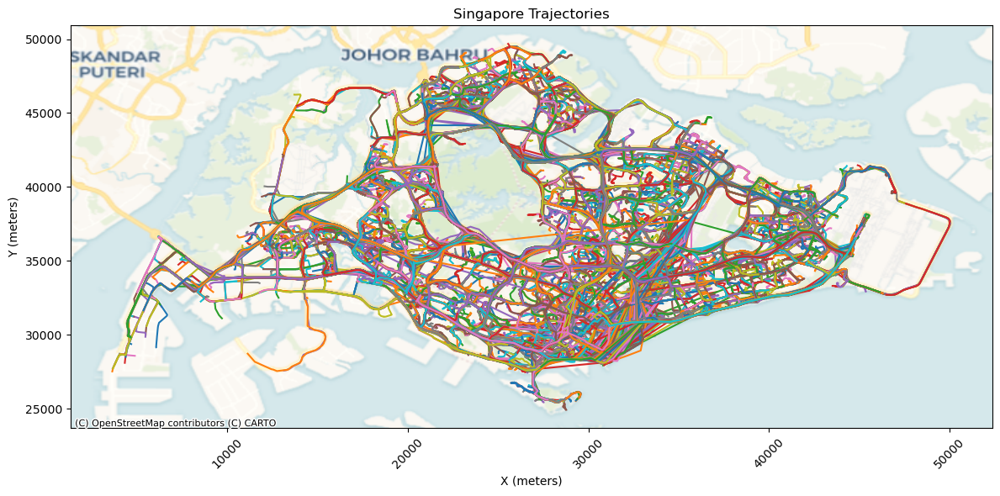

In [22]:
_, ax = plt.subplots(figsize=(12, 6))
_ = TemporalPointSequencePlotter.plot_sequences_xy(trajectories['Trajectory'], axes=ax, show_markers=False,
                                                   show_grid=False)
ax.set_xlabel('X (meters)')
ax.set_ylabel('Y (meters)')
ax.set_title('Singapore Trajectories')
_ = cx.add_basemap(ax, crs=3414, source=cx.providers.CartoDB.Voyager)
plt.tight_layout()

In [32]:
bay = shp.set_srid(shp.Point(32232.5740, 30189.7942), 3414)
airport = shp.set_srid(shp.Point(44452.1091, 35088.7227), 3414)

bay_bb = STBox.from_geometry_time(bay, TsTzSpan(lower='2019-04-08', upper='2019-04-22', upper_inc=True)).expand(1000)
airport_bb = STBox.from_geometry_time(airport, TsTzSpan(lower='2019-04-08', upper='2019-04-22', upper_inc=True)).expand(
    1000)

joined_bb = (bay_bb + airport_bb).expand(100)

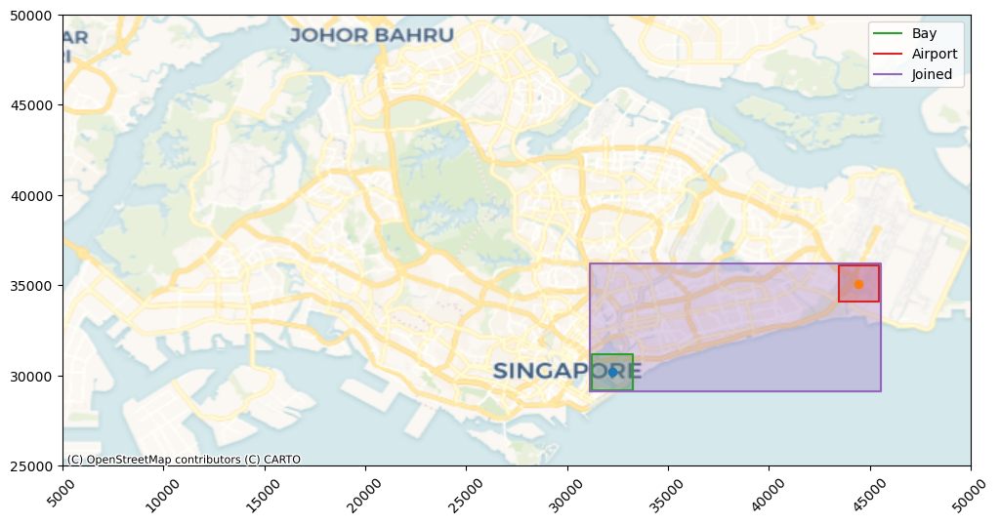

In [33]:
_, ax = plt.subplots(figsize=(12, 6))
ax.set_ylim(25000, 50000)
ax.set_xlim(5000, 50000)
_ = ax.plot(bay.x, bay.y, marker="o")
_ = ax.plot(airport.x, airport.y, marker="o")
_ = bay_bb.plot_xy(axes=ax, label='Bay')
_ = airport_bb.plot_xy(axes=ax, label='Airport')
_ = joined_bb.plot_xy(axes=ax, label='Joined')
_ = cx.add_basemap(ax, crs=3414, source=cx.providers.CartoDB.Voyager)
_ = plt.legend()

In [34]:
intersect_index = trajectories['Trajectory'].progress_map(lambda trip: trip.ever_intersects(joined_bb))
possible_trips = trajectories[intersect_index]
external_trips = trajectories[~intersect_index]

  0%|          | 0/28000 [00:00<?, ?it/s]

In [35]:
trips_index = possible_trips['Trajectory'].progress_map(lambda trip: trip.ever_intersects(bay_bb)
                                                                     and trip.ever_intersects(airport_bb))
trips = possible_trips[trips_index]
non_trips_internal = possible_trips[~trips_index]

bay_trips = non_trips_internal[non_trips_internal['Trajectory'].map(lambda trip: trip.ever_intersects(bay_bb))]
airport_trips = non_trips_internal[non_trips_internal['Trajectory'].map(lambda trip: trip.ever_intersects(airport_bb))]

  0%|          | 0/15875 [00:00<?, ?it/s]

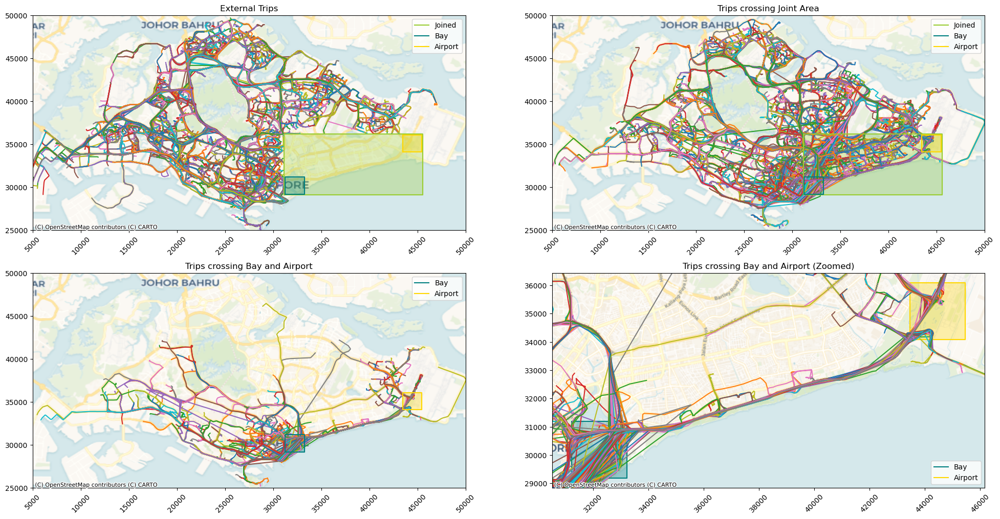

In [36]:
_, ax = plt.subplots(2, 2, figsize=(24, 12))
_ = TemporalPointSequencePlotter.plot_sequences_xy(external_trips['Trajectory'], axes=ax[0][0], show_markers=False,
                                                   show_grid=False)
_ = TemporalPointSequencePlotter.plot_sequences_xy(possible_trips['Trajectory'], axes=ax[0][1], show_markers=False,
                                                   show_grid=False)
_ = TemporalPointSequencePlotter.plot_sequences_xy(trips['Trajectory'], axes=ax[1][0], show_markers=False,
                                                   show_grid=False)
ax[0][0].set_title('External Trips')
ax[0][1].set_title('Trips crossing Joint Area')
ax[1][0].set_title('Trips crossing Bay and Airport')
ax[1][1].set_title('Trips crossing Bay and Airport (Zoomed)')
_ = joined_bb.plot_xy(axes=ax[0][0], color='yellowgreen', label='Joined')
_ = joined_bb.plot_xy(axes=ax[0][1], color='yellowgreen', label='Joined')
for a in [ax[0][0], ax[0][1], ax[1][0]]:
    _ = bay_bb.plot_xy(axes=a, color='teal', label='Bay')
    _ = airport_bb.plot_xy(axes=a, color='gold', label='Airport')
    _ = a.set_ylim(25000, 50000)
    _ = a.set_xlim(5000, 50000)
    _ = cx.add_basemap(a, crs=3414, source=cx.providers.CartoDB.Voyager)
    _ = a.legend()
_ = bay_bb.plot_xy(axes=ax[1][1], color='teal', label='Bay')
_ = airport_bb.plot_xy(axes=ax[1][1], color='gold', label='Airport')
_ = cx.add_basemap(ax[1][1], crs=3414, source=cx.providers.CartoDB.Voyager)
_ = TemporalPointSequencePlotter.plot_sequences_xy(trips['Trajectory'], axes=ax[1][1], show_markers=False,
                                                   show_grid=False)
_ = plt.legend()

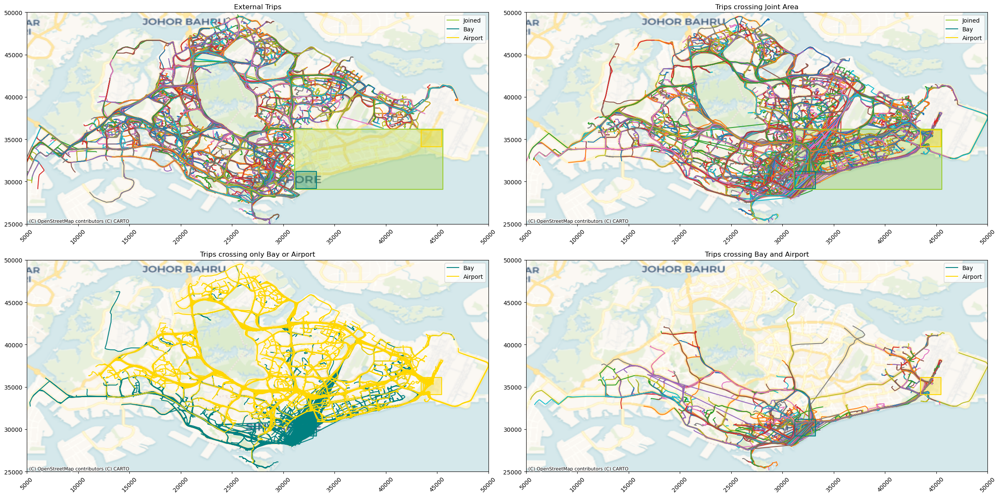

In [37]:
_, ax = plt.subplots(2, 2, figsize=(24, 12))
_ = TemporalPointSequencePlotter.plot_sequences_xy(external_trips['Trajectory'], axes=ax[0][0], show_markers=False,
                                                   show_grid=False)
_ = TemporalPointSequencePlotter.plot_sequences_xy(possible_trips['Trajectory'], axes=ax[0][1], show_markers=False,
                                                   show_grid=False)
_ = TemporalPointSequencePlotter.plot_sequences_xy(bay_trips['Trajectory'], axes=ax[1][0], show_markers=False,
                                                   color='teal', show_grid=False)
_ = TemporalPointSequencePlotter.plot_sequences_xy(airport_trips['Trajectory'], axes=ax[1][0], show_markers=False,
                                                   color='gold', show_grid=False)
_ = TemporalPointSequencePlotter.plot_sequences_xy(trips['Trajectory'], axes=ax[1][1], show_markers=False,
                                                   show_grid=False)
ax[0][0].set_title('External Trips')
ax[0][1].set_title('Trips crossing Joint Area')
ax[1][0].set_title('Trips crossing only Bay or Airport')
ax[1][1].set_title('Trips crossing Bay and Airport')
_ = joined_bb.plot_xy(axes=ax[0][0], color='yellowgreen', label='Joined')
_ = joined_bb.plot_xy(axes=ax[0][1], color='yellowgreen', label='Joined')
for r in ax:
    for a in r:
        _ = bay_bb.plot_xy(axes=a, color='teal', label='Bay')
        _ = airport_bb.plot_xy(axes=a, color='gold', label='Airport')
        _ = a.set_ylim(25000, 50000)
        _ = a.set_xlim(5000, 50000)
        _ = cx.add_basemap(a, crs=3414, source=cx.providers.CartoDB.Voyager)
        _ = a.legend()
_ = plt.legend()
_ = plt.tight_layout()

In [38]:
t = trips.copy()
t['Speed'] = t['Speed'].apply(lambda x: x.as_hexwkb())
t['Bearing'] = t['Bearing'].apply(lambda x: x.as_hexwkb())
t['Trajectory'] = t['Trajectory'].apply(lambda x: x.as_hexwkb())
t.to_csv('trips.csv')

nt = pd.concat([
    external_trips.copy(),
    non_trips_internal.copy(),
])
nt['Speed'] = nt['Speed'].apply(lambda x: x.as_hexwkb())
nt['Bearing'] = nt['Bearing'].apply(lambda x: x.as_hexwkb())
nt['Trajectory'] = nt['Trajectory'].apply(lambda x: x.as_hexwkb())
nt.to_csv('non_trips.csv')

## Splitting trajectories into one-leg trips

In [39]:
trips = pd.read_csv('trips.csv', index_col='Trajectory ID', converters={
    'Speed': TFloatSeq.from_hexwkb,
    'Bearing': TFloatSeq.from_hexwkb,
    'Trajectory': partial(TGeomPointSeq.from_hexwkb, srid=3414)
})
non_trips = pd.read_csv('non_trips.csv', index_col='Trajectory ID', converters={
    'Speed': TFloatSeq.from_hexwkb,
    'Bearing': TFloatSeq.from_hexwkb,
    'Trajectory': partial(TGeomPointSeq.from_hexwkb, srid=3414)
})
trips.head()

,Speed,Bearing,Trajectory
Trajectory ID,,,
3,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08...",[POINT(29996.54969954285 29441.684052369)@2019...
17,"[16.280000686645508@2019-04-10 09:09:45+02, 17...","[111@2019-04-10 09:09:45+02, 89@2019-04-10 09:...",[POINT(29559.5966648224 28344.05174416896)@201...
20,"[18.15345573425293@2019-04-08 02:45:31+02, 18....","[213@2019-04-08 02:45:31+02, 214@2019-04-08 02...",[POINT(44204.41430793665 35240.73944976214)@20...
58,"[23.779346466064453@2019-04-14 10:38:02+02, 24...","[202@2019-04-14 10:38:02+02, 204@2019-04-14 10...",[POINT(44437.1931495493 35722.30764444145)@201...
74,"[16.75@2019-04-11 10:56:04+02, 15.75@2019-04-1...","[1@2019-04-11 10:56:04+02, 337@2019-04-11 10:5...",[POINT(44134.1323889753 33937.46092056917)@201...


In [44]:
geometry_trips = trips.copy()
geometry_trips['Is Inside'] = geometry_trips['Trajectory'].map(
    lambda trip: trip.is_spatially_contained_in(bay_bb).temporal_or(
        trip.is_spatially_contained_in(airport_bb)))
geometry_trips['Time Inside'] = geometry_trips['Is Inside'].map(lambda t: t.when_true())
geometry_trips['Period'] = geometry_trips['Time Inside'].map(lambda t: t.to_span())
geometry_trips['Time Outside'] = geometry_trips.apply(lambda row: row['Is Inside'].at(row['Period']).when_false(),
                                                      axis=1)
geometry_trips['Single Trips'] = geometry_trips.apply(lambda row: row['Trajectory'].at(row['Time Outside']), axis=1)
geometry_trips.head()

,Speed,Bearing,Trajectory,Is Inside,Time Inside,Period,Time Outside,Single Trips
Trajectory ID,,,,,,,,
3,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08...",[POINT(29996.54969954285 29441.684052369)@2019...,"{[f@2019-04-12 08:32:42+02, f@2019-04-12 08:36...","{(2019-04-12 08:36:28.387075+02, 2019-04-12 08...","(2019-04-12 08:36:28.387075+02, 2019-04-12 08:...","{[2019-04-12 08:37:55.93067+02, 2019-04-12 08:...",{[POINT(33232.573985428004 30890.171877963247)...
17,"[16.280000686645508@2019-04-10 09:09:45+02, 17...","[111@2019-04-10 09:09:45+02, 89@2019-04-10 09:...",[POINT(29559.5966648224 28344.05174416896)@201...,"{[f@2019-04-10 09:09:45+02, f@2019-04-10 09:12...","{(2019-04-10 09:12:35.496064+02, 2019-04-10 09...","(2019-04-10 09:12:35.496064+02, 2019-04-10 09:...","{[2019-04-10 09:15:28.327847+02, 2019-04-10 09...",{[POINT(33232.57399711099 30892.497936433367)@...
20,"[18.15345573425293@2019-04-08 02:45:31+02, 18....","[213@2019-04-08 02:45:31+02, 214@2019-04-08 02...",[POINT(44204.41430793665 35240.73944976214)@20...,"{[t@2019-04-08 02:45:31+02, f@2019-04-08 02:46...","{[2019-04-08 02:45:31+02, 2019-04-08 02:46:38....","[2019-04-08 02:45:31+02, 2019-04-08 02:56:47.7...","{[2019-04-08 02:46:38.694093+02, 2019-04-08 02...",{[POINT(43452.10910282743 34147.54785928629)@2...
58,"[23.779346466064453@2019-04-14 10:38:02+02, 24...","[202@2019-04-14 10:38:02+02, 204@2019-04-14 10...",[POINT(44437.1931495493 35722.30764444145)@201...,"{[t@2019-04-14 10:38:02+02, f@2019-04-14 10:39...","{[2019-04-14 10:38:02+02, 2019-04-14 10:39:21....","[2019-04-14 10:38:02+02, 2019-04-14 10:49:10.1...","{[2019-04-14 10:39:21.801152+02, 2019-04-14 10...",{[POINT(43452.10910684249 34147.81294210341)@2...
74,"[16.75@2019-04-11 10:56:04+02, 15.75@2019-04-1...","[1@2019-04-11 10:56:04+02, 337@2019-04-11 10:5...",[POINT(44134.1323889753 33937.46092056917)@201...,"{[f@2019-04-11 10:56:04+02, f@2019-04-11 10:56...","{(2019-04-11 10:56:13.749242+02, 2019-04-11 10...","(2019-04-11 10:56:13.749242+02, 2019-04-11 11:...","{[2019-04-11 10:57:21.21311+02, 2019-04-11 11:...",{[POINT(43603.58635310948 34088.72270584403)@2...


### Method 1: Geometry-based splitting

We start with a geometry-based approach where we split trajectories based on spatial containment within specific areas (bay and airport bounding boxes). This method extracts the parts of trajectories that are outside these areas, creating trip segments between the locations of interest.

In [45]:
geometry_one_leg_trips = geometry_trips[['Single Trips', 'Speed', 'Bearing']].copy()
geometry_one_leg_trips['Single Trips'] = geometry_one_leg_trips['Single Trips'].apply(
    lambda trip: trip.sequences())
geometry_one_leg_trips = geometry_one_leg_trips.explode('Single Trips').rename({'Single Trips': 'Trip'},
                                                                               axis=1)
geometry_one_leg_trips.insert(0, 'Trip #', geometry_one_leg_trips.groupby('Trajectory ID').cumcount() + 1)
geometry_one_leg_trips.head()

,Trip #,Trip,Speed,Bearing
Trajectory ID,,,,
3,1,[POINT(33232.573985428004 30890.171877963247)@...,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08..."
17,1,[POINT(33232.57399711099 30892.497936433367)@2...,"[16.280000686645508@2019-04-10 09:09:45+02, 17...","[111@2019-04-10 09:09:45+02, 89@2019-04-10 09:..."
20,1,[POINT(43452.10910282743 34147.54785928629)@20...,"[18.15345573425293@2019-04-08 02:45:31+02, 18....","[213@2019-04-08 02:45:31+02, 214@2019-04-08 02..."
58,1,[POINT(43452.10910684249 34147.81294210341)@20...,"[23.779346466064453@2019-04-14 10:38:02+02, 24...","[202@2019-04-14 10:38:02+02, 204@2019-04-14 10..."
74,1,[POINT(43603.58635310948 34088.72270584403)@20...,"[16.75@2019-04-11 10:56:04+02, 15.75@2019-04-1...","[1@2019-04-11 10:56:04+02, 337@2019-04-11 10:5..."


In [48]:
geometry_one_leg_trips['Speed'] = geometry_one_leg_trips.apply(
    lambda row: row['Speed'].at(row['Trip'].timespan()), axis=1)
geometry_one_leg_trips['Bearing'] = geometry_one_leg_trips.apply(
    lambda row: row['Bearing'].at(row['Trip'].timespan()), axis=1)
geometry_one_leg_trips.head()

,Trip #,Trip,Speed,Bearing
Trajectory ID,,,,
3,1,[POINT(33232.573985428004 30890.171877963247)@...,[23.957136690740587@2019-04-12 08:37:55.93067+...,[87.58911083333334@2019-04-12 08:37:55.93067+0...
17,1,[POINT(33232.57399711099 30892.497936433367)@2...,[17.460443426070213@2019-04-10 09:15:28.327847...,"[87@2019-04-10 09:15:28.327847+02, 87@2019-04-..."
20,1,[POINT(43452.10910282743 34147.54785928629)@20...,[20.658410758348133@2019-04-08 02:46:38.694093...,"[214@2019-04-08 02:46:38.694093+02, 214@2019-0..."
58,1,[POINT(43452.10910684249 34147.81294210341)@20...,[22.69432296911621@2019-04-14 10:39:21.801152+...,"[213@2019-04-14 10:39:21.801152+02, 213@2019-0..."
74,1,[POINT(43603.58635310948 34088.72270584403)@20...,"[14.61296203125@2019-04-11 10:57:21.21311+02, ...","[224.2259240625@2019-04-11 10:57:21.21311+02, ..."


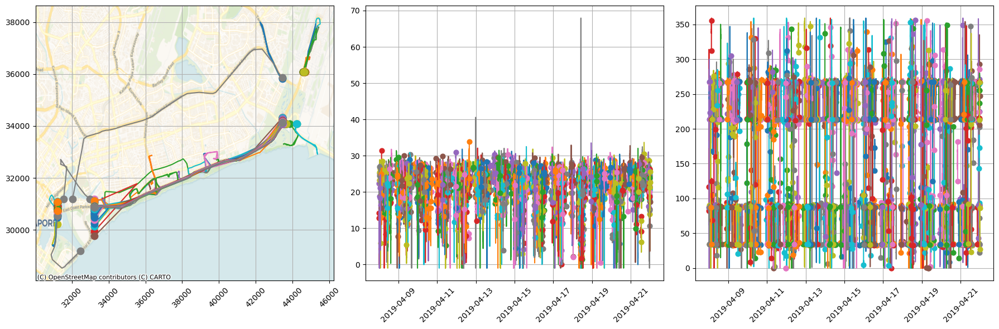

In [71]:
_, ax = plt.subplots(1, 3, figsize=(18, 6))

_ = TemporalPointSequencePlotter.plot_sequences_xy(geometry_one_leg_trips['Trip'], axes=ax[0])
_ = cx.add_basemap(ax[0], crs=3414, source=cx.providers.CartoDB.Voyager)

_ = TemporalSequencePlotter.plot_sequences(geometry_one_leg_trips['Speed'], axes=ax[1])
_ = TemporalSequencePlotter.plot_sequences(geometry_one_leg_trips['Bearing'], axes=ax[2])
plt.tight_layout()

### Method 2: Stops-based splitting

Now, we split the trajectories using the stops method, which splits a trajectory into segments by identifying stops (places where a vehicle stays relatively stationary for a period of time). This is useful for identifying meaningful trip segments separated by parking, traffic lights, or other stopping points.

For cars, we define a stop as staying within 50 meters for at least 5 minutes.

In [75]:
from datetime import timedelta

# Now, we split the trajectories using the stops method, which splits a trajectory into segments 
# by splitting the trajectory at every stop (defined by a maximum distance moved in a certain amount of time).
stops_trips = trips.copy()

def extract_stops_time(trip):
    """Extract stops time periods from a trajectory, handling cases where no stops are found."""
    stops_result = trip.stops(50.0, timedelta(minutes=5))
    if stops_result is None:
        # No stops found, return empty time period set
        return None
    return stops_result.time()

stops_trips['Stops'] = stops_trips['Trajectory'].apply(extract_stops_time)
stops_trips['Single Trips'] = stops_trips.apply(
    lambda row: [row['Trajectory']] if row['Stops'] is None 
    else row['Trajectory'].minus(row['Stops']).sequences(), axis=1)
stops_trips.head()

,Speed,Bearing,Trajectory,Stops,Single Trips
Trajectory ID,,,,,
3,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08...",[POINT(29996.54969954285 29441.684052369)@2019...,None,[[POINT(29996.54969954285 29441.684052369)@201...
17,"[16.280000686645508@2019-04-10 09:09:45+02, 17...","[111@2019-04-10 09:09:45+02, 89@2019-04-10 09:...",[POINT(29559.5966648224 28344.05174416896)@201...,None,[[POINT(29559.5966648224 28344.05174416896)@20...
20,"[18.15345573425293@2019-04-08 02:45:31+02, 18....","[213@2019-04-08 02:45:31+02, 214@2019-04-08 02...",[POINT(44204.41430793665 35240.73944976214)@20...,None,[[POINT(44204.41430793665 35240.73944976214)@2...
58,"[23.779346466064453@2019-04-14 10:38:02+02, 24...","[202@2019-04-14 10:38:02+02, 204@2019-04-14 10...",[POINT(44437.1931495493 35722.30764444145)@201...,None,[[POINT(44437.1931495493 35722.30764444145)@20...
74,"[16.75@2019-04-11 10:56:04+02, 15.75@2019-04-1...","[1@2019-04-11 10:56:04+02, 337@2019-04-11 10:5...",[POINT(44134.1323889753 33937.46092056917)@201...,None,[[POINT(44134.1323889753 33937.46092056917)@20...


In [76]:
stops_single_trips = stops_trips[['Single Trips', 'Speed', 'Bearing']].copy()
stops_single_trips = stops_single_trips.explode('Single Trips').rename({'Single Trips': 'Trip'}, axis=1)
stops_single_trips.insert(0, 'Trip #', stops_single_trips.groupby('Trajectory ID').cumcount() + 1)
stops_single_trips.head()

,Trip #,Trip,Speed,Bearing
Trajectory ID,,,,
3,1,[POINT(29996.54969954285 29441.684052369)@2019...,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08..."
17,1,[POINT(29559.5966648224 28344.05174416896)@201...,"[16.280000686645508@2019-04-10 09:09:45+02, 17...","[111@2019-04-10 09:09:45+02, 89@2019-04-10 09:..."
20,1,[POINT(44204.41430793665 35240.73944976214)@20...,"[18.15345573425293@2019-04-08 02:45:31+02, 18....","[213@2019-04-08 02:45:31+02, 214@2019-04-08 02..."
58,1,[POINT(44437.1931495493 35722.30764444145)@201...,"[23.779346466064453@2019-04-14 10:38:02+02, 24...","[202@2019-04-14 10:38:02+02, 204@2019-04-14 10..."
74,1,[POINT(44134.1323889753 33937.46092056917)@201...,"[16.75@2019-04-11 10:56:04+02, 15.75@2019-04-1...","[1@2019-04-11 10:56:04+02, 337@2019-04-11 10:5..."


In [79]:
stops_single_trips['Speed'] = stops_single_trips.apply(
    lambda row: row['Speed'].at(row['Trip'].timespan()), axis=1)
stops_single_trips['Bearing'] = stops_single_trips.apply(
    lambda row: row['Bearing'].at(row['Trip'].timespan()), axis=1)
stops_single_trips.head()

,Trip #,Trip,Speed,Bearing
Trajectory ID,,,,
3,1,[POINT(29996.54969954285 29441.684052369)@2019...,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08..."
17,1,[POINT(29559.5966648224 28344.05174416896)@201...,"[16.280000686645508@2019-04-10 09:09:45+02, 17...","[111@2019-04-10 09:09:45+02, 89@2019-04-10 09:..."
20,1,[POINT(44204.41430793665 35240.73944976214)@20...,"[18.15345573425293@2019-04-08 02:45:31+02, 18....","[213@2019-04-08 02:45:31+02, 214@2019-04-08 02..."
58,1,[POINT(44437.1931495493 35722.30764444145)@201...,"[23.779346466064453@2019-04-14 10:38:02+02, 24...","[202@2019-04-14 10:38:02+02, 204@2019-04-14 10..."
74,1,[POINT(44134.1323889753 33937.46092056917)@201...,"[16.75@2019-04-11 10:56:04+02, 15.75@2019-04-1...","[1@2019-04-11 10:56:04+02, 337@2019-04-11 10:5..."


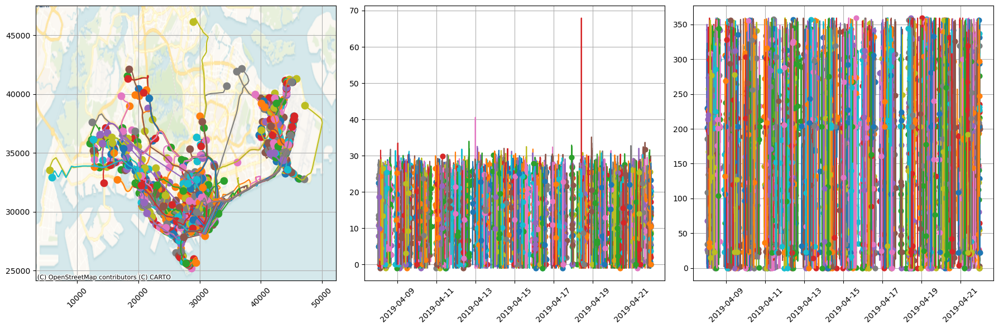

In [80]:
_, ax = plt.subplots(1, 3, figsize=(18, 6))

_ = TemporalPointSequencePlotter.plot_sequences_xy(stops_single_trips['Trip'], axes=ax[0])
_ = cx.add_basemap(ax[0], crs=3414, source=cx.providers.CartoDB.Voyager)

_ = TemporalSequencePlotter.plot_sequences(stops_single_trips['Speed'], axes=ax[1])
_ = TemporalSequencePlotter.plot_sequences(stops_single_trips['Bearing'], axes=ax[2])
plt.tight_layout()

### Comparison of both methods

Let's compare the results from both trajectory splitting methods:

In [83]:
print("Geometry-based method:")
print(f"Number of one-leg trips: {len(geometry_one_leg_trips)}")
print(f"Average trips per trajectory: {len(geometry_one_leg_trips) / len(trips):.2f}")
print("\nStops-based method:")
print(f"Number of one-leg trips: {len(stops_single_trips)}")
print(f"Average trips per trajectory: {len(stops_single_trips) / len(trips):.2f}")

# Compare the trip distributions
print("\nGeometry method - Trip # distribution:")
print(geometry_one_leg_trips['Trip #'].value_counts().sort_index())
print("\nStops method - Trip # distribution:")
print(stops_single_trips['Trip #'].value_counts().sort_index())

Geometry-based method:
Number of one-leg trips: 1518
Average trips per trajectory: 1.05

Stops-based method:
Number of one-leg trips: 1448
Average trips per trajectory: 1.00

Geometry method - Trip # distribution:
Trip #
1    1448
2      64
3       6
Name: count, dtype: int64

Stops method - Trip # distribution:
Trip #
1    1448
Name: count, dtype: int64


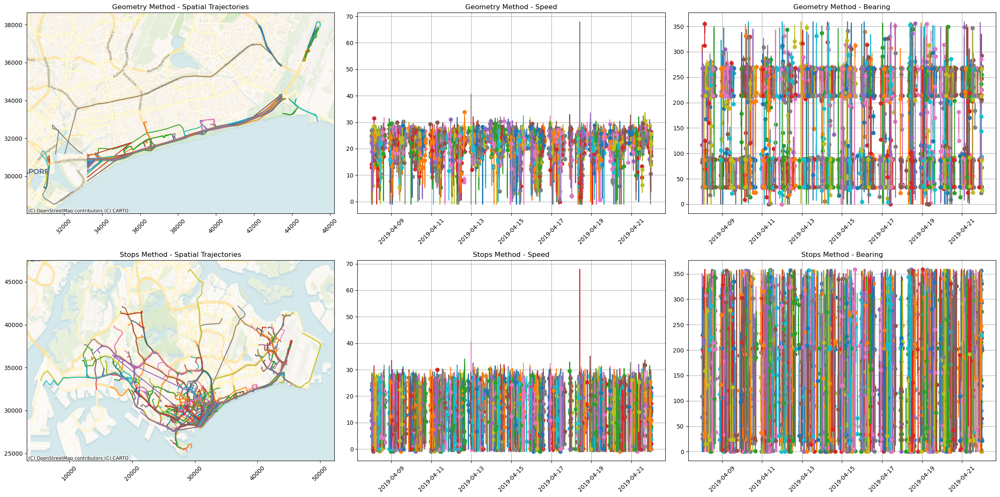

In [84]:
# Create side-by-side visualization comparing both methods
fig, axes = plt.subplots(2, 3, figsize=(24, 12))

# Geometry method plots
_ = TemporalPointSequencePlotter.plot_sequences_xy(geometry_one_leg_trips['Trip'], axes=axes[0][0], 
                                                   show_markers=False, show_grid=False)
_ = cx.add_basemap(axes[0][0], crs=3414, source=cx.providers.CartoDB.Voyager)
axes[0][0].set_title('Geometry Method - Spatial Trajectories')

_ = TemporalSequencePlotter.plot_sequences(geometry_one_leg_trips['Speed'], axes=axes[0][1])
axes[0][1].set_title('Geometry Method - Speed')

_ = TemporalSequencePlotter.plot_sequences(geometry_one_leg_trips['Bearing'], axes=axes[0][2])
axes[0][2].set_title('Geometry Method - Bearing')

# Stops method plots  
_ = TemporalPointSequencePlotter.plot_sequences_xy(stops_single_trips['Trip'], axes=axes[1][0], 
                                                   show_markers=False, show_grid=False)
_ = cx.add_basemap(axes[1][0], crs=3414, source=cx.providers.CartoDB.Voyager)
axes[1][0].set_title('Stops Method - Spatial Trajectories')

_ = TemporalSequencePlotter.plot_sequences(stops_single_trips['Speed'], axes=axes[1][1])
axes[1][1].set_title('Stops Method - Speed')

_ = TemporalSequencePlotter.plot_sequences(stops_single_trips['Bearing'], axes=axes[1][2])
axes[1][2].set_title('Stops Method - Bearing')

plt.tight_layout()
plt.show()

## Trajectory Heatmap

In [50]:
trajectories = pd.read_csv('singapore_trajectories.csv', index_col='Trajectory ID', converters={
    'Speed': TFloatSeq.from_hexwkb,
    'Bearing': TFloatSeq.from_hexwkb,
    'Trajectory': partial(TGeomPointSeq.from_hexwkb, srid=3414)
})
trajectories.head()

,Speed,Bearing,Trajectory
Trajectory ID,,,
2,"[25.457024@2019-04-09 02:38:49+02, 25.45879@20...","[97@2019-04-09 02:38:49+02, 93@2019-04-09 02:3...",[POINT(30758.23769803839 28093.07811101536)@20...
3,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08...",[POINT(29996.54969954285 29441.684052369)@2019...
4,"[7.6499996@2019-04-13 10:42:46+02, 7.04@2019-0...","[205@2019-04-13 10:42:46+02, 194@2019-04-13 10...",[POINT(31299.05194543063 37460.64431485069)@20...
5,"[2.309606552124023@2019-04-20 01:39:39+02, 10....","[28@2019-04-20 01:39:39+02, 38@2019-04-20 01:3...",[POINT(21727.50153948193 35893.66292291419)@20...
8,"[13.21@2019-04-11 07:24:36+02, 0@2019-04-11 07...","[319@2019-04-11 07:24:36+02, 0@2019-04-11 07:2...",[POINT(41327.00952410777 35147.23516406312)@20...


In [51]:
bbox: STBox = TemporalPointExtentAggregator.aggregate(trips['Trajectory'])

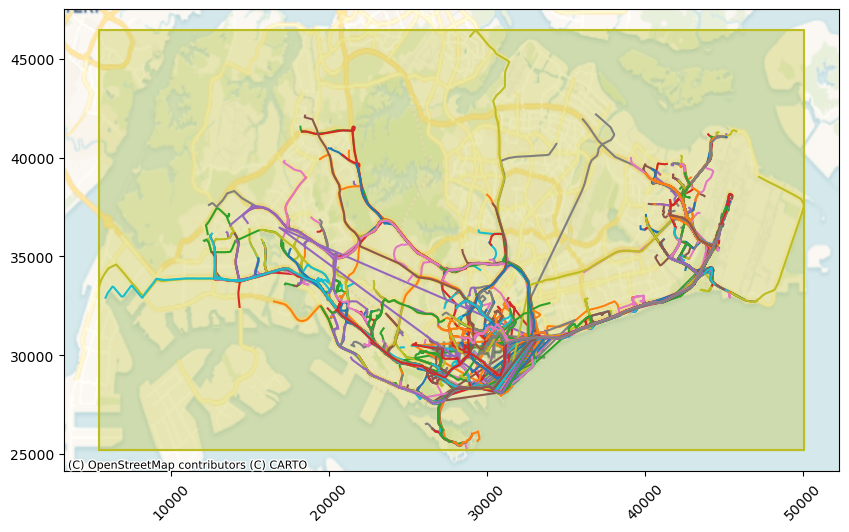

In [52]:
fig, ax = plt.subplots(figsize=(10, 6))
_ = TemporalPointSequencePlotter.plot_sequences_xy(trips['Trajectory'], axes=ax, show_markers=False,
                                                   show_grid=False)
_ = bbox.plot_xy(axes=ax)
_ = cx.add_basemap(ax, crs=3414, source=cx.providers.CartoDB.Voyager)

In [56]:
heat_df = pd.DataFrame()

# Get spatial bounds from bbox
xmin, xmax = bbox.xmin(), bbox.xmax()
ymin, ymax = bbox.ymin(), bbox.ymax()

# Create spatial tiles manually
tile_size = 500
x_tiles = int((xmax - xmin) / tile_size) + 1
y_tiles = int((ymax - ymin) / tile_size) + 1

tiles = []
for i in range(x_tiles):
    for j in range(y_tiles):
        tile_xmin = xmin + i * tile_size
        tile_xmax = min(xmin + (i + 1) * tile_size, xmax)
        tile_ymin = ymin + j * tile_size
        tile_ymax = min(ymin + (j + 1) * tile_size, ymax)
        
        # Create spatial-only STBox for each tile
        tile = STBox.from_geometry(shp.box(tile_xmin, tile_ymin, tile_xmax, tile_ymax))
        tile = tile.set_srid(3414)
        tiles.append(tile)

heat_df['Tile'] = tiles
heat_df['# Trajectories'] = heat_df['Tile'].progress_map(
    lambda tile: sum(trips['Trajectory'].map(lambda tp: tp.ever_intersects(tile))))
heat_df['X'] = heat_df['Tile'].map(lambda tile: (tile.xmin() + tile.xmax()) / 2)
heat_df['Y'] = heat_df['Tile'].map(lambda tile: (tile.ymin() + tile.ymax()) / 2)
heat_df.head()

  0%|          | 0/3870 [00:00<?, ?it/s]

,Tile,# Trajectories,X,Y
0,"SRID=3414;STBOX X((5447.991603005292,25201.137...",0,5697.991603,25451.137996
1,"SRID=3414;STBOX X((5447.991603005292,25701.137...",0,5697.991603,25951.137996
2,"SRID=3414;STBOX X((5447.991603005292,26201.137...",0,5697.991603,26451.137996
3,"SRID=3414;STBOX X((5447.991603005292,26701.137...",0,5697.991603,26951.137996
4,"SRID=3414;STBOX X((5447.991603005292,27201.137...",0,5697.991603,27451.137996


In [57]:
svy21 = pyproj.CRS('EPSG:3414')
wgs84 = pyproj.CRS('EPSG:4326')

project = partial(transform, pyproj.Transformer.from_crs(svy21, wgs84, always_xy=True).transform)

heat_df['Coords'] = pd.Series(shp.points(heat_df['X'], heat_df['Y'])).map(project)
heat_df['Lat'] = heat_df['Coords'].map(lambda p: p.y)
heat_df['Lon'] = heat_df['Coords'].map(lambda p: p.x)
heat_df.head()

,Tile,# Trajectories,X,Y,Coords,Lat,Lon
0,"SRID=3414;STBOX X((5447.991603005292,25201.137...",0,5697.991603,25451.137996,POINT (103.6329295418575 1.246437861771866),1.246438,103.632930
1,"SRID=3414;STBOX X((5447.991603005292,25701.137...",0,5697.991603,25951.137996,POINT (103.6329291994173 1.250959659747486),1.250960,103.632929
2,"SRID=3414;STBOX X((5447.991603005292,26201.137...",0,5697.991603,26451.137996,POINT (103.6329288557361 1.255481457566583),1.255481,103.632929
3,"SRID=3414;STBOX X((5447.991603005292,26701.137...",0,5697.991603,26951.137996,POINT (103.6329285108139 1.260003255228592),1.260003,103.632929
4,"SRID=3414;STBOX X((5447.991603005292,27201.137...",0,5697.991603,27451.137996,POINT (103.6329281646506 1.264525052732948),1.264525,103.632928


In [58]:
heat_df.to_csv('heatmap.csv', index=False)

In [59]:
heat_df = pd.read_csv('heatmap.csv')

In [60]:
fig = px.density_mapbox(heat_df, lat='Lat', lon='Lon', z='# Trajectories',
                        radius=20,
                        zoom=11,
                        mapbox_style='open-street-map',
                        width=1500,
                        height=800,
                        )
fig.show()

In [61]:
fig.write_image('heatmap.png')

## Metric extraction

In [62]:
trajectories = pd.read_csv('singapore_trajectories.csv', index_col='Trajectory ID', converters={
    'Speed': TFloatSeq.from_hexwkb,
    'Bearing': TFloatSeq.from_hexwkb,
    'Trajectory': partial(TGeomPointSeq.from_hexwkb, srid=3414)
})
trajectories.head()

,Speed,Bearing,Trajectory
Trajectory ID,,,
2,"[25.457024@2019-04-09 02:38:49+02, 25.45879@20...","[97@2019-04-09 02:38:49+02, 93@2019-04-09 02:3...",[POINT(30758.23769803839 28093.07811101536)@20...
3,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08...",[POINT(29996.54969954285 29441.684052369)@2019...
4,"[7.6499996@2019-04-13 10:42:46+02, 7.04@2019-0...","[205@2019-04-13 10:42:46+02, 194@2019-04-13 10...",[POINT(31299.05194543063 37460.64431485069)@20...
5,"[2.309606552124023@2019-04-20 01:39:39+02, 10....","[28@2019-04-20 01:39:39+02, 38@2019-04-20 01:3...",[POINT(21727.50153948193 35893.66292291419)@20...
8,"[13.21@2019-04-11 07:24:36+02, 0@2019-04-11 07...","[319@2019-04-11 07:24:36+02, 0@2019-04-11 07:2...",[POINT(41327.00952410777 35147.23516406312)@20...


In [63]:
trajectories['Distance'] = trajectories['Trajectory'].map(lambda t: t.length())
trajectories['Avg Speed'] = trajectories['Speed'].map(lambda s: s.time_weighted_average())
trajectories['Avg Direction'] = trajectories['Bearing'].map(lambda b: b.time_weighted_average())
trajectories['Travel Time'] = trajectories['Trajectory'].map(lambda t: t.duration().seconds)
trajectories.head()

,Speed,Bearing,Trajectory,Distance,Avg Speed,Avg Direction,Travel Time
Trajectory ID,,,,,,,
2,"[25.457024@2019-04-09 02:38:49+02, 25.45879@20...","[97@2019-04-09 02:38:49+02, 93@2019-04-09 02:3...",[POINT(30758.23769803839 28093.07811101536)@20...,27618.206747,19.502562,187.151155,1515
3,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08...",[POINT(29996.54969954285 29441.684052369)@2019...,16631.983956,16.472509,57.439929,1132
4,"[7.6499996@2019-04-13 10:42:46+02, 7.04@2019-0...","[205@2019-04-13 10:42:46+02, 194@2019-04-13 10...",[POINT(31299.05194543063 37460.64431485069)@20...,17595.512554,13.310255,179.646711,1353
5,"[2.309606552124023@2019-04-20 01:39:39+02, 10....","[28@2019-04-20 01:39:39+02, 38@2019-04-20 01:3...",[POINT(21727.50153948193 35893.66292291419)@20...,18077.668540,13.318033,110.320343,1283
8,"[13.21@2019-04-11 07:24:36+02, 0@2019-04-11 07...","[319@2019-04-11 07:24:36+02, 0@2019-04-11 07:2...",[POINT(41327.00952410777 35147.23516406312)@20...,15816.076253,12.852342,236.563433,1206


In [64]:
total_distance = sum(trajectories['Distance'])
print(f"Total distance: {total_distance}")

Total distance: 515676269.80622584


In [65]:
average_speed = sum(trajectories['Avg Speed'] * trajectories['Travel Time']) / sum(trajectories['Travel Time'])
print(f"Average speed: {average_speed}")

Average speed: 15.572540961090974


## Close cars identification

In [66]:
trajectories = pd.read_csv('singapore_trajectories.csv', index_col='Trajectory ID', converters={
    'Speed': TFloatSeq.from_hexwkb,
    'Bearing': TFloatSeq.from_hexwkb,
    'Trajectory': partial(TGeomPointSeq.from_hexwkb, srid=3414)
})
trajectories.head()

,Speed,Bearing,Trajectory
Trajectory ID,,,
2,"[25.457024@2019-04-09 02:38:49+02, 25.45879@20...","[97@2019-04-09 02:38:49+02, 93@2019-04-09 02:3...",[POINT(30758.23769803839 28093.07811101536)@20...
3,"[5.639999866485596@2019-04-12 08:32:42+02, 8.6...","[106@2019-04-12 08:32:42+02, 122@2019-04-12 08...",[POINT(29996.54969954285 29441.684052369)@2019...
4,"[7.6499996@2019-04-13 10:42:46+02, 7.04@2019-0...","[205@2019-04-13 10:42:46+02, 194@2019-04-13 10...",[POINT(31299.05194543063 37460.64431485069)@20...
5,"[2.309606552124023@2019-04-20 01:39:39+02, 10....","[28@2019-04-20 01:39:39+02, 38@2019-04-20 01:3...",[POINT(21727.50153948193 35893.66292291419)@20...
8,"[13.21@2019-04-11 07:24:36+02, 0@2019-04-11 07...","[319@2019-04-11 07:24:36+02, 0@2019-04-11 07:2...",[POINT(41327.00952410777 35147.23516406312)@20...


In [67]:
cc_data = []
for i, trip in trajectories['Trajectory'].items():
    for j, other in trajectories['Trajectory'].items():
        if j <= i:
            continue
        if trip.is_ever_within_distance(other, 10):
            print(f'{i} within {j}')
            cc_data.append((i, trip, j, other))

2 within 47828
3 within 74200
5 within 32083
5 within 63422
5 within 65664
5 within 75039
8 within 62510
9 within 82701
11 within 31135
12 within 3943
15 within 59642
15 within 63819
9 within 82701
11 within 31135
12 within 3943
15 within 59642
15 within 63819
20 within 68600
21 within 79435
23 within 12118
23 within 41952
25 within 32889
25 within 43278
25 within 53187
25 within 78943
20 within 68600
21 within 79435
23 within 12118
23 within 41952
25 within 32889
25 within 43278
25 within 53187
25 within 78943
27 within 25481
27 within 61194
27 within 78579
31 within 59251
31 within 73169
31 within 76549
27 within 25481
27 within 61194
27 within 78579
31 within 59251
31 within 73169
31 within 76549
35 within 69982
35 within 70163
36 within 70013
37 within 38475
37 within 64311
39 within 65252
40 within 78321
35 within 69982
35 within 70163
36 within 70013
37 within 38475
37 within 64311
39 within 65252
40 within 78321
41 within 5511
41 within 45315
43 within 12778
44 within 29528
41 w

In [68]:
close_cars = pd.DataFrame(cc_data, columns=['ID 1', 'Trajectory 1', 'ID 2', 'Trajectory 2'])
close_cars.head()

,ID 1,Trajectory 1,ID 2,Trajectory 2
0,2,[POINT(30758.23769803839 28093.07811101536)@20...,47828,[POINT(18454.06371595073 42040.47964928102)@20...
1,3,[POINT(29996.54969954285 29441.684052369)@2019...,74200,[POINT(42848.51596142612 38651.70669657615)@20...
2,5,[POINT(21727.50153948193 35893.66292291419)@20...,32083,[POINT(29255.42840222967 39931.25026224207)@20...
3,5,[POINT(21727.50153948193 35893.66292291419)@20...,63422,[POINT(31231.49360583671 30722.14654973217)@20...
4,5,[POINT(21727.50153948193 35893.66292291419)@20...,65664,[POINT(36538.48141313806 41443.66021002756)@20...


In [69]:
close_cars.to_csv('close_cars.csv', index=False)